# **Deep Convolution Adversarial Networks**

Generative adversarial networks (GANs) are algorithmic architectures that use two neural networks, pitting one against the other (thus the “adversarial”) in order to generate new, synthetic instances of data that can pass for real data. They are used widely in image generation, video generation and voice generation.

GANs are made up of two components -

1. **Generator - generates new data instances**

2. **Discriminator - tries to distinguish the generated or fake data from the real dataset.**

Discriminative algorithms try to classify input data; that is, given the features of an instance of data, they predict a label or category to which that data belongs. So discriminative algorithms map features to labels. They are concerned solely with that correlation.One the other way,loosely speaking,generative algorithms do the opposite. Instead of predicting a label given certain features, they attempt to predict features given a certain label.

While training they both start together from scratch and the generator learn to shape the random distribition through the training epochs.

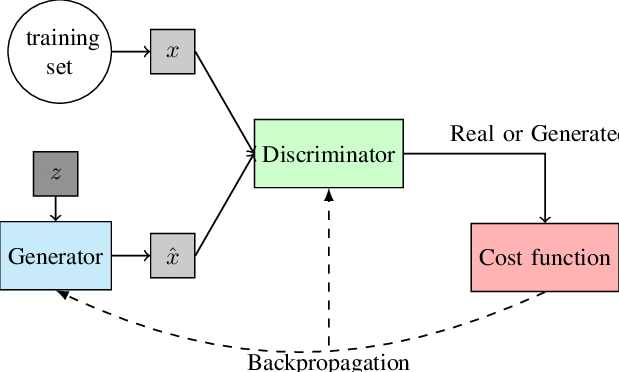

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory


general_path = r'C:\Users\weldl\Datasets\Album Covers Images'
import os
for dirname, _, filenames in os.walk(general_path):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

C:\Users\weldl\Datasets\Album Covers Images\0.jpg
C:\Users\weldl\Datasets\Album Covers Images\1.jpg
C:\Users\weldl\Datasets\Album Covers Images\10.jpg
C:\Users\weldl\Datasets\Album Covers Images\100.jpg
C:\Users\weldl\Datasets\Album Covers Images\1000.jpg
C:\Users\weldl\Datasets\Album Covers Images\10000.jpg
C:\Users\weldl\Datasets\Album Covers Images\10001.jpg
C:\Users\weldl\Datasets\Album Covers Images\10002.jpg
C:\Users\weldl\Datasets\Album Covers Images\10003.jpg
C:\Users\weldl\Datasets\Album Covers Images\10004.jpg
C:\Users\weldl\Datasets\Album Covers Images\10005.jpg
C:\Users\weldl\Datasets\Album Covers Images\10006.jpg
C:\Users\weldl\Datasets\Album Covers Images\10007.jpg
C:\Users\weldl\Datasets\Album Covers Images\10008.jpg
C:\Users\weldl\Datasets\Album Covers Images\10009.jpg
C:\Users\weldl\Datasets\Album Covers Images\1001.jpg
C:\Users\weldl\Datasets\Album Covers Images\10010.jpg
C:\Users\weldl\Datasets\Album Covers Images\10011.jpg
C:\Users\weldl\Datasets\Album Covers Images

# **LOSS FUNCTION of simple GAN**

In the paper that introduced GANs(link below in the reference), the generator tries to minimize the following function while the discriminator tries to maximize it:

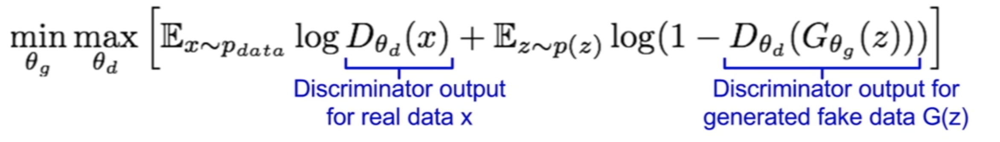

In this function:

D(x) is the discriminator's estimate of the probability that real data instance x is real.

Ex is the expected value over all real data instances.

G(z) is the generator's output when given noise z.

D(G(z)) is the discriminator's estimate of the probability that a fake instance is real.

Ez is the expected value over all random inputs to the generator (in effect, the expected value over all generated fake instances G(z)).

The generator can't directly affect the log(D(x)) term in the function, so, for the generator, minimizing the loss is equivalent to minimizing log(1 - D(G(z))).

# **Loadind and Preprocessing data**

In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import os
from tensorflow.keras import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,Dropout,Dense,Flatten,Conv2DTranspose,BatchNormalization,LeakyReLU,Reshape
import tensorflow as tf


In [3]:
import os
cwd = os.getcwd()
os.chdir(cwd)
# print(os.listdir("../input"))

In [4]:
path_celeb = []
train_path_celeb = general_path
for path in os.listdir(train_path_celeb):
    if '.jpg' in path:
        path_celeb.append(os.path.join(train_path_celeb, path))

In [5]:
new_path=path_celeb[0:5000]

the dataset have more than 202k images of which only 50k are being selected for the training purpose

In [6]:
len(new_path)

5000

In [7]:
# crop = (30, 55, 150, 175) #croping size for the image so that only the face at centre is obtained
# images = [np.array((Image.open(path).crop(crop)).resize((64,64))) for path in new_path]
images = [np.array(Image.open(path).resize((64,64))) for path in new_path]

for i in range(len(images)):
    images[i] = ((images[i] - images[i].min())/(255 - images[i].min()))
    #images[i] = images[i]*2-1  #uncomment this if activation is tanh for generator last layer
    
images = np.array(images) 

In [8]:
train_data=images

In [9]:
print(path_celeb)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [10]:
len(path_celeb)

79734

In [11]:
print(train_data.shape)

(5000, 64, 64, 3)


# **Data Visualization**

In [12]:
def plot_img_samples(img_array, figsize=(12, 14), title=None):
    plt.figure(figsize=figsize)
    plt.title(title)
    idx=0
    for i in range(4):
        for j in range(4):
                plt.subplot(4,4, i*4 + j +1)
                plt.imshow(img_array[idx].reshape(64,64,3))
                idx+=1
    plt.tight_layout()
    plt.show()

**Note**  -- the image pixels are normalized dividing each pixel by 255 and then modified to bring within (-1,1) range by multiplying with 2 and substracting 1 since the last layer activation of generator is tanh whose range limits (-1,1)

In [13]:
X_train = train_data

# **Architecture of the Model**

The core to the DCGAN architecture uses a standard CNN architecture on the discriminative model. For the generator, convolutions are replaced with upconvolutions, so the representation at each layer of the generator is actually successively larger, as it mapes from a low-dimensional latent vector onto a high-dimensional image.



Use batch normalization in both the generator and the discriminator.

Remove fully connected hidden layers for deeper architectures.

Use ReLU activation in generator for all layers except for the output, which uses Tanh.

Use LeakyReLU activation in the discriminator for all layers.

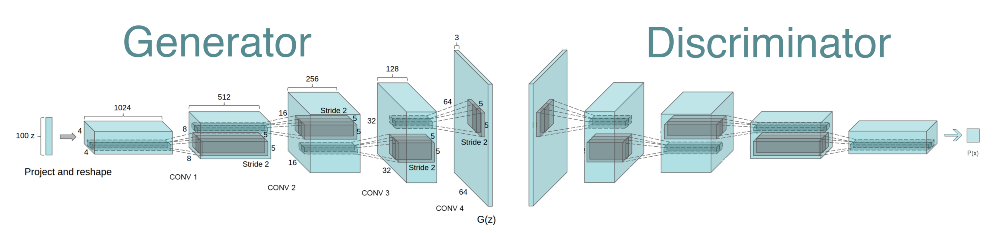

# **Generator**

In [14]:
noise_shape = 100

In [15]:
generator=Sequential()
generator.add(Dense(4*4*512,input_shape=[noise_shape]))
generator.add(Reshape([4,4,512]))
generator.add(Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(64, kernel_size=4, strides=2, padding="same"))
generator.add(LeakyReLU(alpha=0.2))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(3, kernel_size=4, strides=2, padding="same",
                                 activation='sigmoid'))

the last layer for generator  have sigmoid activation in this version since I was trying between sigmoid and tanh to see which outputs better results. I found sigmoid activated model having better clarity in this case, however I have tried tanh activated generator too so if anyone want to refer to that can look at version 6/7 of this kernel where I use tanh. In case of using tanh the input pixels should be normalised between (-1,1) unlike sigmoid where it has been normalised between (0,1) .


In [16]:
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8192)              827392    
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 256)         2097408   
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 8, 8, 256)         0         
_________________________________________________________________
batch_normalization (BatchNo (None, 8, 8, 256)         1024      
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 128)       524416    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 128)       0

# **Discriminator**

In [17]:
discriminator = Sequential()
discriminator.add(Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=[64,64, 3]))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.4))
discriminator.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.4))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation='sigmoid'))

In [18]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 64)        36928     
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 16384)            

# **DCGAN (combined model)**

In [19]:
GAN =Sequential([generator,discriminator])

In [20]:
discriminator.compile(optimizer='adam',loss='binary_crossentropy')
discriminator.trainable = False

In [21]:
GAN.compile(optimizer='adam',loss='binary_crossentropy')

In [22]:
GAN.layers

In [23]:
GAN.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 64, 64, 3)         3585219   
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 55105     
Total params: 3,640,324
Trainable params: 3,584,323
Non-trainable params: 56,001
_________________________________________________________________


# **Training**

In [24]:
epochs = 100  #set epoch according to your training dataset size,i had chosen 50k images hence epochs are high as 300...
batch_size = 32

In [25]:
D_loss=[] #list to collect loss for the discriminator model
G_loss=[] #list to collect loss for generator model

Currently on Epoch 1
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


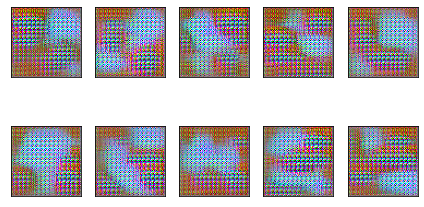

Epoch: 1,  Loss: D_real = 0.111, D_fake = 0.049,  G = 0.414
Currently on Epoch 2
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 2,  Loss: D_real = 0.131, D_fake = 0.173,  G = 0.082
Currently on Epoch 3
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 3,  Loss: D_real = 0.015, D_fake = 0.201,  G = 0.264
Currently on Epoch 4
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 4,  Loss: D_real = 0.118, D_fake = 0.078,  G = 0.360
Currently on Epoch 5
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 5,  Loss: D_real = 0.818, D_fake = 0.046,  G = 0.773
Currently on Epoch 6
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


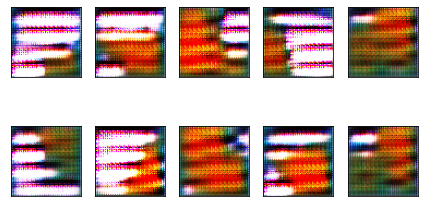

Epoch: 6,  Loss: D_real = 0.241, D_fake = 0.159,  G = 2.002
Currently on Epoch 7
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 7,  Loss: D_real = 0.403, D_fake = 0.324,  G = 2.268
Currently on Epoch 8
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 8,  Loss: D_real = 0.322, D_fake = 0.045,  G = 1.366
Currently on Epoch 9
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 9,  Loss: D_real = 0.026, D_fake = 0.612,  G = 2.630
Currently on Epoch 10
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 10,  Loss: D_real = 0.181, D_fake = 0.058,  G = 2.702
Currently on Epoch 11
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


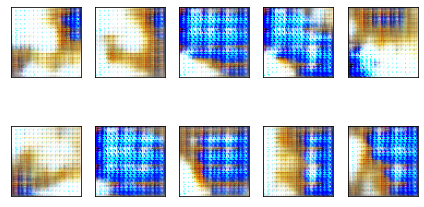

Epoch: 11,  Loss: D_real = 0.282, D_fake = 0.058,  G = 1.755
Currently on Epoch 12
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 12,  Loss: D_real = 0.217, D_fake = 0.531,  G = 2.024
Currently on Epoch 13
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 13,  Loss: D_real = 0.527, D_fake = 0.101,  G = 1.525
Currently on Epoch 14
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 14,  Loss: D_real = 0.047, D_fake = 0.052,  G = 4.035
Currently on Epoch 15
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 15,  Loss: D_real = 0.118, D_fake = 0.333,  G = 0.819
Currently on Epoch 16
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


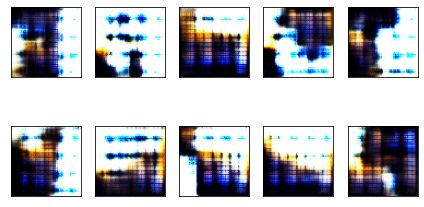

Epoch: 16,  Loss: D_real = 0.431, D_fake = 0.310,  G = 1.757
Currently on Epoch 17
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 17,  Loss: D_real = 0.489, D_fake = 0.164,  G = 1.580
Currently on Epoch 18
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 18,  Loss: D_real = 0.289, D_fake = 0.242,  G = 0.528
Currently on Epoch 19
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 19,  Loss: D_real = 0.366, D_fake = 0.160,  G = 4.209
Currently on Epoch 20
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 20,  Loss: D_real = 0.218, D_fake = 0.495,  G = 0.488
Currently on Epoch 21
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


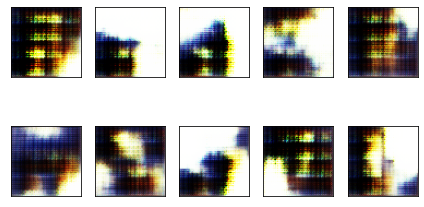

Epoch: 21,  Loss: D_real = 0.586, D_fake = 0.089,  G = 3.112
Currently on Epoch 22
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 22,  Loss: D_real = 0.355, D_fake = 0.440,  G = 0.649
Currently on Epoch 23
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 23,  Loss: D_real = 0.361, D_fake = 0.477,  G = 2.116
Currently on Epoch 24
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 24,  Loss: D_real = 0.413, D_fake = 0.709,  G = 2.037
Currently on Epoch 25
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 25,  Loss: D_real = 0.298, D_fake = 0.504,  G = 2.079
Currently on Epoch 26
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


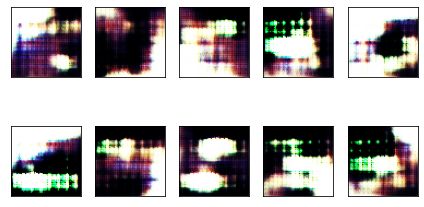

Epoch: 26,  Loss: D_real = 0.475, D_fake = 0.212,  G = 2.146
Currently on Epoch 27
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 27,  Loss: D_real = 0.195, D_fake = 0.258,  G = 2.184
Currently on Epoch 28
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 28,  Loss: D_real = 0.555, D_fake = 0.561,  G = 1.346
Currently on Epoch 29
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 29,  Loss: D_real = 0.291, D_fake = 0.232,  G = 2.765
Currently on Epoch 30
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 30,  Loss: D_real = 0.826, D_fake = 0.207,  G = 0.972
Currently on Epoch 31
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


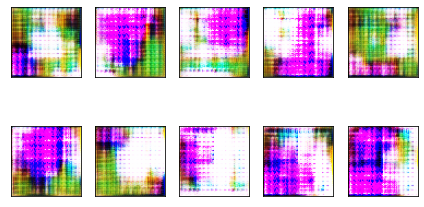

Epoch: 31,  Loss: D_real = 0.277, D_fake = 0.009,  G = 4.800
Currently on Epoch 32
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 32,  Loss: D_real = 0.134, D_fake = 0.507,  G = 2.725
Currently on Epoch 33
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 33,  Loss: D_real = 0.415, D_fake = 0.022,  G = 7.388
Currently on Epoch 34
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 34,  Loss: D_real = 0.359, D_fake = 0.695,  G = 1.752
Currently on Epoch 35
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 35,  Loss: D_real = 0.386, D_fake = 0.054,  G = 2.467
Currently on Epoch 36
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


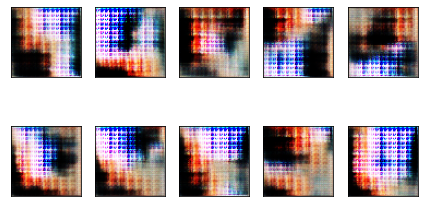

Epoch: 36,  Loss: D_real = 0.245, D_fake = 0.137,  G = 3.034
Currently on Epoch 37
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 37,  Loss: D_real = 0.135, D_fake = 0.364,  G = 1.853
Currently on Epoch 38
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 38,  Loss: D_real = 0.159, D_fake = 1.229,  G = 2.306
Currently on Epoch 39
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 39,  Loss: D_real = 0.518, D_fake = 0.157,  G = 4.373
Currently on Epoch 40
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 40,  Loss: D_real = 0.345, D_fake = 0.424,  G = 1.868
Currently on Epoch 41
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


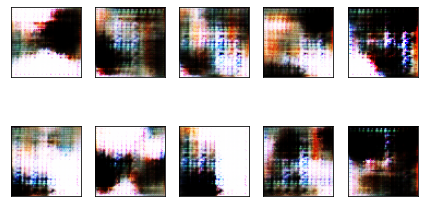

Epoch: 41,  Loss: D_real = 0.448, D_fake = 0.571,  G = 2.163
Currently on Epoch 42
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 42,  Loss: D_real = 0.345, D_fake = 0.366,  G = 2.341
Currently on Epoch 43
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 43,  Loss: D_real = 0.296, D_fake = 0.639,  G = 1.858
Currently on Epoch 44
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 44,  Loss: D_real = 0.372, D_fake = 0.557,  G = 1.915
Currently on Epoch 45
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 45,  Loss: D_real = 0.453, D_fake = 0.736,  G = 1.969
Currently on Epoch 46
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


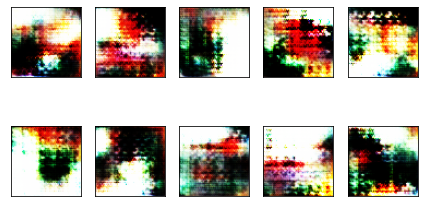

Epoch: 46,  Loss: D_real = 0.401, D_fake = 0.687,  G = 1.790
Currently on Epoch 47
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 47,  Loss: D_real = 0.424, D_fake = 0.521,  G = 1.738
Currently on Epoch 48
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 48,  Loss: D_real = 0.594, D_fake = 0.804,  G = 1.643
Currently on Epoch 49
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 49,  Loss: D_real = 0.421, D_fake = 0.476,  G = 2.979
Currently on Epoch 50
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 50,  Loss: D_real = 0.326, D_fake = 0.544,  G = 2.221
Currently on Epoch 51
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


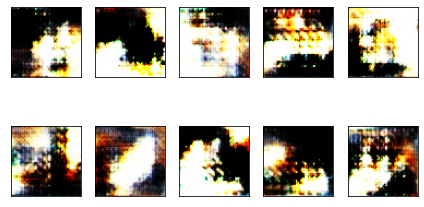

Epoch: 51,  Loss: D_real = 0.565, D_fake = 0.387,  G = 1.544
Currently on Epoch 52
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 52,  Loss: D_real = 0.774, D_fake = 0.418,  G = 1.952
Currently on Epoch 53
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 53,  Loss: D_real = 0.474, D_fake = 0.324,  G = 1.683
Currently on Epoch 54
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 54,  Loss: D_real = 0.492, D_fake = 0.493,  G = 1.794
Currently on Epoch 55
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 55,  Loss: D_real = 0.691, D_fake = 0.223,  G = 2.642
Currently on Epoch 56
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


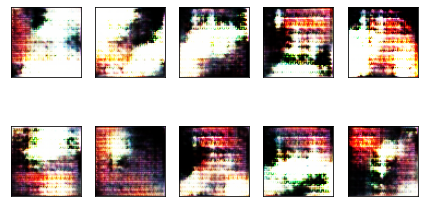

Epoch: 56,  Loss: D_real = 0.846, D_fake = 0.382,  G = 2.283
Currently on Epoch 57
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 57,  Loss: D_real = 0.499, D_fake = 0.229,  G = 2.446
Currently on Epoch 58
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 58,  Loss: D_real = 0.403, D_fake = 0.513,  G = 2.664
Currently on Epoch 59
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 59,  Loss: D_real = 0.471, D_fake = 0.329,  G = 1.680
Currently on Epoch 60
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 60,  Loss: D_real = 0.579, D_fake = 0.243,  G = 3.051
Currently on Epoch 61
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


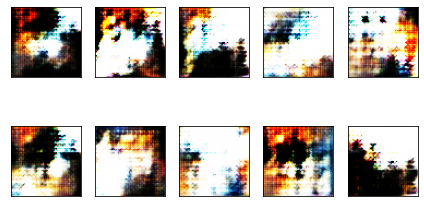

Epoch: 61,  Loss: D_real = 0.736, D_fake = 0.395,  G = 1.948
Currently on Epoch 62
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 62,  Loss: D_real = 0.443, D_fake = 0.721,  G = 1.618
Currently on Epoch 63
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 63,  Loss: D_real = 0.175, D_fake = 0.090,  G = 3.427
Currently on Epoch 64
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 64,  Loss: D_real = 0.842, D_fake = 0.277,  G = 2.034
Currently on Epoch 65
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 65,  Loss: D_real = 0.727, D_fake = 0.237,  G = 2.207
Currently on Epoch 66
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


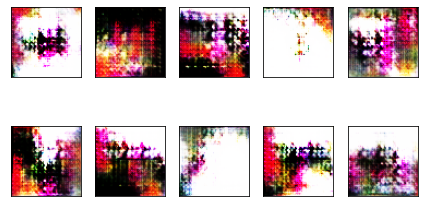

Epoch: 66,  Loss: D_real = 0.624, D_fake = 0.903,  G = 2.164
Currently on Epoch 67
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156
Epoch: 67,  Loss: D_real = 0.358, D_fake = 0.321,  G = 2.407
Currently on Epoch 68
	Currently on batch number 0 of 156
	Currently on batch number 100 of 156


KeyboardInterrupt: 

In [26]:
with tf.device('/gpu:0'):
 for epoch in range(epochs):
    print(f"Currently on Epoch {epoch+1}")
    
    # For every batch in the dataset
    for i in range(X_train.shape[0]//batch_size):
        
        if (i)%100 == 0:
            print(f"\tCurrently on batch number {i} of {len(X_train)//batch_size}")
            
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        
        gen_image = generator.predict_on_batch(noise)
        
        train_dataset = X_train[i*batch_size:(i+1)*batch_size]
        #train on real image
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = True
        d_loss1 = discriminator.train_on_batch(train_dataset,train_label)
        
        #train on fake image
        train_label=np.zeros(shape=(batch_size,1))
        d_loss2 = discriminator.train_on_batch(gen_image,train_label)
        
        
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = False
        #train the generator
        g_loss = GAN.train_on_batch(noise, train_label)
        D_loss.append(d_loss1+d_loss2)
        G_loss.append(g_loss)
        
         
    if epoch % 5 == 0:
        samples = 10
        x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples,100)))

        for k in range(samples):
            plt.subplot(2, 5, k+1)
            plt.imshow(x_fake[k].reshape(64,64,3))
            plt.xticks([])
            plt.yticks([])

        
        plt.tight_layout()
        plt.show()
    print('Epoch: %d,  Loss: D_real = %.3f, D_fake = %.3f,  G = %.3f' %   (epoch+1, d_loss1, d_loss2, g_loss))        
print('Training is complete')

approx training time for 300 epochs was somthing little more than 2 hours.

# **Output Visualization**

In [27]:
noise=np.random.uniform(-1,1,size=[500,noise_shape])

In [28]:
im=generator.predict(noise)

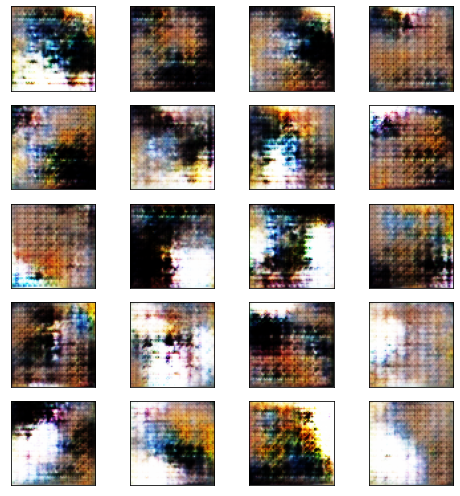

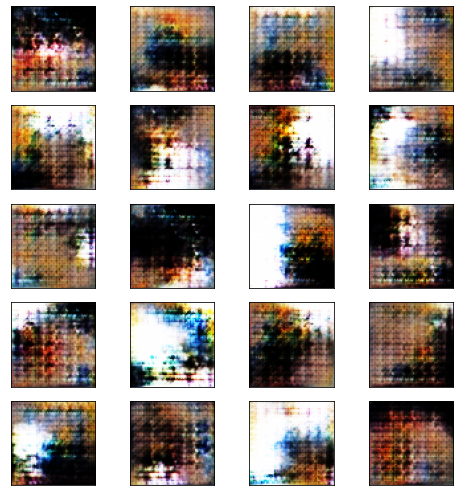

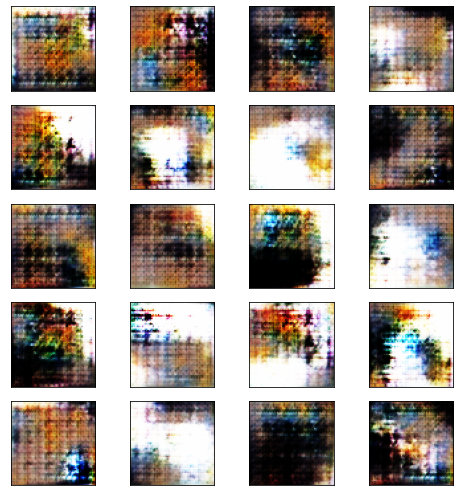

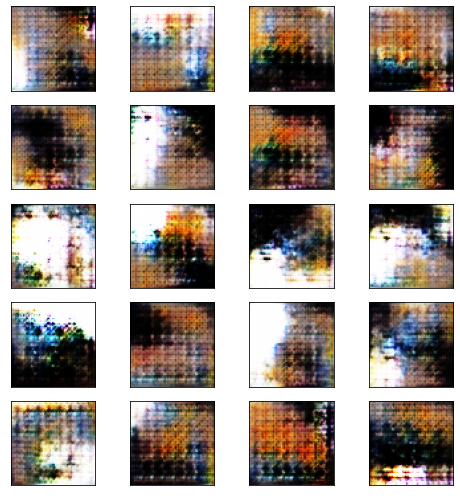

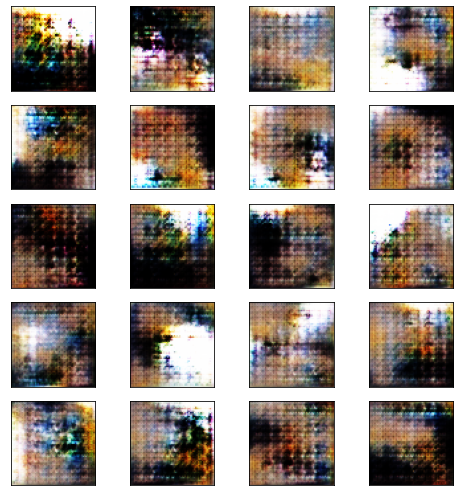

In [29]:
for i in range(5):
 plt.figure(figsize=(7,7))   
 for k in range(20):
            noise=np.random.uniform(-1,1,size=[100,noise_shape])
            im=generator.predict(noise) 
            plt.subplot(5, 4, k+1)
            plt.imshow(im[k].reshape(64,64,3))
            plt.xticks([])
            plt.yticks([])
 
 plt.tight_layout()
 plt.show()

# **Loss Curve**

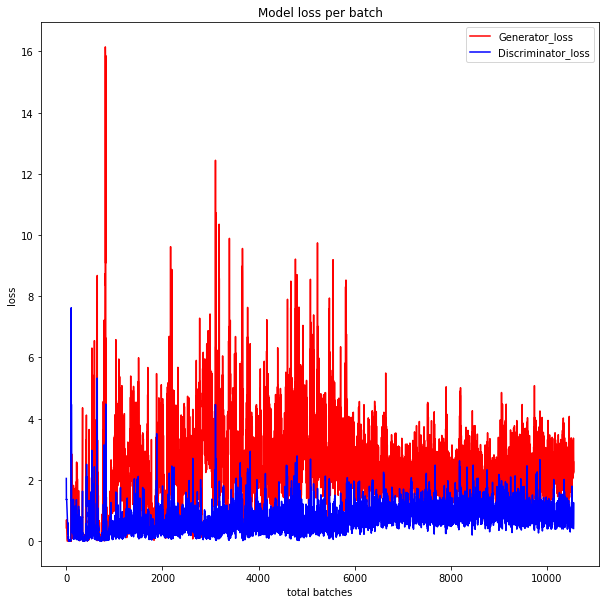

In [30]:
plt.figure(figsize=(10,10))
plt.plot(G_loss,color='red',label='Generator_loss')
plt.plot(D_loss,color='blue',label='Discriminator_loss')
plt.legend()
plt.xlabel('total batches')
plt.ylabel('loss')
plt.title('Model loss per batch')
plt.show()

# **Reference**

1. https://medium.com/coloredfeather/generating-human-faces-using-adversarial-network-960863bc1deb blog post
2. https://arxiv.org/abs/1511.06434  paper on DCGANS published in 2016


# **Comment if you have any queries or find anything wrong with the code**

# **Upvote if you like the kernel**

# **Thanks**